# ENDOMETRIOSIS DETECTION WITH EFFICIENTDET D1 MODEL

In [2]:
import tensorflow as tf
print("Tensor version" + tf.__version__)
print(tf.config.list_physical_devices('GPU'))

import json
import shutil
import os
from sklearn.model_selection import train_test_split
import imgaug.augmenters as iaa
import imgaug as ia
import imageio
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage

from object_detection.utils import dataset_util, label_map_util
from object_detection.dataset_tools import create_coco_tf_record
from object_detection.dataset_tools import tf_record_creation_util
from object_detection.dataset_tools import create_coco_tf_record

import pathlib
import matplotlib
import matplotlib.pyplot as plt

import random
import io
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

%matplotlib inline
import matplotlib.patches as patches
import re
from PIL import Image

Tensor version2.13.1
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """
  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)

In [4]:
MODELS_CONFIG = {
    'efficientdet-d1': {
        'model_name': 'efficientdet_d1_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d1_640x640_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d1_coco17_tpu-32.tar.gz',
        'batch_size': 16
    },
}

chosen_model = 'efficientdet-d1'

num_steps = 40000 #The more steps, the longer the training.
num_eval_steps = 500 #Perform evaluation after so many steps

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']
batch_size = MODELS_CONFIG[chosen_model]['batch_size'] 

In [5]:
%cd "/home/759635/models/research/deploy/"
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint

!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

/home/759635/models/research/deploy
--2023-11-09 14:47:19--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d1_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 216.58.201.123, 172.217.169.91, 142.250.187.251, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|216.58.201.123|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 51839363 (49M) [application/x-tar]
Saving to: ‘efficientdet_d1_coco17_tpu-32.tar.gz’

100%[======================================>] 51,839,363  40.1MB/s   in 1.2s   

2023-11-09 14:47:21 (40.1 MB/s) - ‘efficientdet_d1_coco17_tpu-32.tar.gz’ saved [51839363/51839363]



In [6]:
#download base training configuration file
%cd /content/models/research/deploy
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

[Errno 2] No such file or directory: '/content/models/research/deploy'
/home/759635/models/research/deploy
--2023-11-09 14:47:39--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d1_640x640_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4630 (4.5K) [text/plain]
Saving to: ‘ssd_efficientdet_d1_640x640_coco17_tpu-8.config’

100%[======================================>] 4,630       --.-K/s   in 0.06s   

2023-11-09 14:47:40 (74.0 KB/s) - ‘ssd_efficientdet_d1_640x640_coco17_tpu-8.config’ saved [4630/4630]



In [5]:
#File paths for the pipeline configuration and fine-tune checkpoint
pipeline_fname = '/home/759635/models/research/deploy/' + base_pipeline_file
fine_tune_checkpoint_efficientdet_d1 = '/home/759635/models/research/deploy/' + model_name + '/checkpoint/ckpt-0'
label_map_file = '/home/759635/Glenda_v1.5_classes/label_map.pbtxt'

# Function to get the number of classes from the label map file
def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_file)

In [6]:
num_classes

4

In [10]:
'''
writing the custom configuration file by slotting the dataset, model checkpoint, and training parameters into the 
base pipeline file using regular expression

'''
train_record_pattern = '/home/759635/Glenda_v1.5_classes/tfrecords/train.record-*'
test_record_pattern = '/home/759635/Glenda_v1.5_classes/tfrecords/test.record-*'

print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()

# Path for the sharded TFRecord files (use wildcard)
train_record_fname = train_record_pattern
test_record_fname = test_record_pattern

with open('pipeline_file.config', 'w') as f:
    # Replace fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint_efficientdet_d1), s)

    # Replace tfrecord files train and test with wildcard paths.
    s = re.sub('input_path: ".*?train.*?"', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub('input_path: ".*?val.*?"', 'input_path: "{}"'.format(test_record_fname), s)

    # Replace label_map_path
    s = re.sub('label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_file), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+', 'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+', 'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+', 'num_classes: {}'.format(num_classes), s)

    # Set fine-tune checkpoint type
    s = re.sub('fine_tune_checkpoint_type: ".*?"', 'fine_tune_checkpoint_type: "detection"', s)

    f.write(s)

writing custom configuration file


In [7]:
#Display the contents of the pipeline file
%cat /home/759635/models/research/deploy/pipeline_file.config

 # SSD with EfficientNet-b1 + BiFPN feature extractor,
# shared box predictor and focal loss (a.k.a EfficientDet-d1).
# See EfficientDet, Tan et al, https://arxiv.org/abs/1911.09070
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from an EfficientNet-b1 checkpoint.
#
# Train on TPU-8

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 4
    add_background_class: false
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      m

In [8]:
# File path for the model training pipeline configuration
pipeline_file = '/home/759635/models/research/deploy/pipeline_file.config'

# Directory path where the trained model or model checkpoints will be saved
model_dir = '/home/759635/training_efficientdet_d1/'

In [13]:
# Couldn't execute model with the initial training steps, had to reduce to 80000 from 300000 and yet it didn't run, 
#now on 40000

### Model Training 

In [9]:
!python /home/759635/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2023-11-09 21:15:32.473261: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-09 21:15:35.218445: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-11-09 21:15:44.545104: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43419 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I1109 21:15:44.548819 139876243507008 mirrored_strategy.py:419] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 40000
I1109 21:

Instructions for updating:
rename to distribute_datasets_from_function
W1109 21:15:48.076880 139876243507008 deprecation.py:364] From /home/759635/.local/lib/python3.10/site-packages/object_detection/model_lib_v2.py:563: StrategyBase.experimental_distribute_datasets_from_function (from tensorflow.python.distribute.distribute_lib) is deprecated and will be removed in a future version.
Instructions for updating:
rename to distribute_datasets_from_function
INFO:tensorflow:Reading unweighted datasets: ['/home/759635/Glenda_v1.5_classes/tfrecords/train.record-*']
I1109 21:15:48.086226 139876243507008 dataset_builder.py:162] Reading unweighted datasets: ['/home/759635/Glenda_v1.5_classes/tfrecords/train.record-*']
INFO:tensorflow:Reading record datasets for input file: ['/home/759635/Glenda_v1.5_classes/tfrecords/train.record-*']
I1109 21:15:48.100168 139876243507008 dataset_builder.py:79] Reading record datasets for input file: ['/home/759635/Glenda_v1.5_classes/tfrecords/train.record-*']
I

I1109 21:17:29.166366 139873889404672 api.py:460] feature_map_spatial_dims: [(80, 80), (40, 40), (20, 20), (10, 10), (5, 5)]
W1109 21:17:38.039607 139873889404672 utils.py:82] Gradients do not exist for variables ['stack_6/block_1/expand_bn/gamma:0', 'stack_6/block_1/expand_bn/beta:0', 'stack_6/block_1/depthwise_conv2d/depthwise_kernel:0', 'stack_6/block_1/depthwise_bn/gamma:0', 'stack_6/block_1/depthwise_bn/beta:0', 'stack_6/block_1/project_bn/gamma:0', 'stack_6/block_1/project_bn/beta:0', 'top_bn/gamma:0', 'top_bn/beta:0'] when minimizing the loss. If you're using `model.compile()`, did you forget to provide a `loss` argument?
2023-11-09 21:17:46.646979: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inEfficientDet-D1/model/stack_0/block_1/drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
INFO:tensorflow:Step 17100 per-step time 2.125s
I1109 21:20:14.375015 139

INFO:tensorflow:Step 18300 per-step time 1.385s
I1109 21:47:15.807727 139876243507008 model_lib_v2.py:705] Step 18300 per-step time 1.385s
INFO:tensorflow:{'Loss/classification_loss': 0.083152905,
 'Loss/localization_loss': 0.04696831,
 'Loss/regularization_loss': 0.051908363,
 'Loss/total_loss': 0.18202958,
 'learning_rate': 0.07944453}
I1109 21:47:15.808396 139876243507008 model_lib_v2.py:708] {'Loss/classification_loss': 0.083152905,
 'Loss/localization_loss': 0.04696831,
 'Loss/regularization_loss': 0.051908363,
 'Loss/total_loss': 0.18202958,
 'learning_rate': 0.07944453}
INFO:tensorflow:Step 18400 per-step time 1.378s
I1109 21:49:33.631292 139876243507008 model_lib_v2.py:705] Step 18400 per-step time 1.378s
INFO:tensorflow:{'Loss/classification_loss': 0.06842542,
 'Loss/localization_loss': 0.013718468,
 'Loss/regularization_loss': 0.05184376,
 'Loss/total_loss': 0.13398765,
 'learning_rate': 0.079437494}
I1109 21:49:33.631946 139876243507008 model_lib_v2.py:708] {'Loss/classifica

INFO:tensorflow:Step 19800 per-step time 1.349s
I1109 22:21:33.608761 139876243507008 model_lib_v2.py:705] Step 19800 per-step time 1.349s
INFO:tensorflow:{'Loss/classification_loss': 0.04751143,
 'Loss/localization_loss': 0.018620878,
 'Loss/regularization_loss': 0.050988756,
 'Loss/total_loss': 0.11712106,
 'learning_rate': 0.079334356}
I1109 22:21:33.609430 139876243507008 model_lib_v2.py:708] {'Loss/classification_loss': 0.04751143,
 'Loss/localization_loss': 0.018620878,
 'Loss/regularization_loss': 0.050988756,
 'Loss/total_loss': 0.11712106,
 'learning_rate': 0.079334356}
INFO:tensorflow:Step 19900 per-step time 1.357s
I1109 22:23:49.266659 139876243507008 model_lib_v2.py:705] Step 19900 per-step time 1.357s
INFO:tensorflow:{'Loss/classification_loss': 0.06306558,
 'Loss/localization_loss': 0.012868803,
 'Loss/regularization_loss': 0.050924797,
 'Loss/total_loss': 0.12685917,
 'learning_rate': 0.07932666}
I1109 22:23:49.267305 139876243507008 model_lib_v2.py:708] {'Loss/classifi

INFO:tensorflow:Step 21300 per-step time 1.372s
I1109 22:55:53.177538 139876243507008 model_lib_v2.py:705] Step 21300 per-step time 1.372s
INFO:tensorflow:{'Loss/classification_loss': 0.059768338,
 'Loss/localization_loss': 0.013630079,
 'Loss/regularization_loss': 0.050125994,
 'Loss/total_loss': 0.12352441,
 'learning_rate': 0.07921432}
I1109 22:55:53.178208 139876243507008 model_lib_v2.py:708] {'Loss/classification_loss': 0.059768338,
 'Loss/localization_loss': 0.013630079,
 'Loss/regularization_loss': 0.050125994,
 'Loss/total_loss': 0.12352441,
 'learning_rate': 0.07921432}
INFO:tensorflow:Step 21400 per-step time 1.371s
I1109 22:58:10.254319 139876243507008 model_lib_v2.py:705] Step 21400 per-step time 1.371s
INFO:tensorflow:{'Loss/classification_loss': 0.052119143,
 'Loss/localization_loss': 0.010601677,
 'Loss/regularization_loss': 0.05005193,
 'Loss/total_loss': 0.11277275,
 'learning_rate': 0.07920597}
I1109 22:58:10.254954 139876243507008 model_lib_v2.py:708] {'Loss/classifi

INFO:tensorflow:Step 22700 per-step time 1.360s
I1109 23:27:53.049899 139876243507008 model_lib_v2.py:705] Step 22700 per-step time 1.360s
INFO:tensorflow:{'Loss/classification_loss': 0.055723865,
 'Loss/localization_loss': 0.014034676,
 'Loss/regularization_loss': 0.04926294,
 'Loss/total_loss': 0.11902148,
 'learning_rate': 0.079093404}
I1109 23:27:53.050557 139876243507008 model_lib_v2.py:708] {'Loss/classification_loss': 0.055723865,
 'Loss/localization_loss': 0.014034676,
 'Loss/regularization_loss': 0.04926294,
 'Loss/total_loss': 0.11902148,
 'learning_rate': 0.079093404}
INFO:tensorflow:Step 22800 per-step time 1.359s
I1109 23:30:08.927114 139876243507008 model_lib_v2.py:705] Step 22800 per-step time 1.359s
INFO:tensorflow:{'Loss/classification_loss': 0.054380916,
 'Loss/localization_loss': 0.009039782,
 'Loss/regularization_loss': 0.04919212,
 'Loss/total_loss': 0.11261281,
 'learning_rate': 0.07908444}
I1109 23:30:08.927796 139876243507008 model_lib_v2.py:708] {'Loss/classifi

INFO:tensorflow:Step 24200 per-step time 1.368s
I1110 00:02:07.747808 139876243507008 model_lib_v2.py:705] Step 24200 per-step time 1.368s
INFO:tensorflow:{'Loss/classification_loss': 0.061908666,
 'Loss/localization_loss': 0.012457681,
 'Loss/regularization_loss': 0.048835307,
 'Loss/total_loss': 0.12320165,
 'learning_rate': 0.078954384}
I1110 00:02:07.749263 139876243507008 model_lib_v2.py:708] {'Loss/classification_loss': 0.061908666,
 'Loss/localization_loss': 0.012457681,
 'Loss/regularization_loss': 0.048835307,
 'Loss/total_loss': 0.12320165,
 'learning_rate': 0.078954384}
INFO:tensorflow:Step 24300 per-step time 1.363s
I1110 00:04:24.038669 139876243507008 model_lib_v2.py:705] Step 24300 per-step time 1.363s
INFO:tensorflow:{'Loss/classification_loss': 0.057427783,
 'Loss/localization_loss': 0.008697952,
 'Loss/regularization_loss': 0.048782513,
 'Loss/total_loss': 0.11490825,
 'learning_rate': 0.078944765}
I1110 00:04:24.039353 139876243507008 model_lib_v2.py:708] {'Loss/clas

INFO:tensorflow:Step 25700 per-step time 1.370s
I1110 00:36:20.531455 139876243507008 model_lib_v2.py:705] Step 25700 per-step time 1.370s
INFO:tensorflow:{'Loss/classification_loss': 0.051047307,
 'Loss/localization_loss': 0.0118111735,
 'Loss/regularization_loss': 0.048118006,
 'Loss/total_loss': 0.11097649,
 'learning_rate': 0.07880557}
I1110 00:36:20.532083 139876243507008 model_lib_v2.py:708] {'Loss/classification_loss': 0.051047307,
 'Loss/localization_loss': 0.0118111735,
 'Loss/regularization_loss': 0.048118006,
 'Loss/total_loss': 0.11097649,
 'learning_rate': 0.07880557}
INFO:tensorflow:Step 25800 per-step time 1.370s
I1110 00:38:37.561707 139876243507008 model_lib_v2.py:705] Step 25800 per-step time 1.370s
INFO:tensorflow:{'Loss/classification_loss': 0.057725627,
 'Loss/localization_loss': 0.0098520955,
 'Loss/regularization_loss': 0.04806613,
 'Loss/total_loss': 0.11564385,
 'learning_rate': 0.07879531}
I1110 00:38:37.562369 139876243507008 model_lib_v2.py:708] {'Loss/class

INFO:tensorflow:Step 27100 per-step time 1.393s
I1110 01:08:22.173935 139876243507008 model_lib_v2.py:705] Step 27100 per-step time 1.393s
INFO:tensorflow:{'Loss/classification_loss': 0.06212622,
 'Loss/localization_loss': 0.014445246,
 'Loss/regularization_loss': 0.04742144,
 'Loss/total_loss': 0.123992905,
 'learning_rate': 0.07865791}
I1110 01:08:22.175724 139876243507008 model_lib_v2.py:708] {'Loss/classification_loss': 0.06212622,
 'Loss/localization_loss': 0.014445246,
 'Loss/regularization_loss': 0.04742144,
 'Loss/total_loss': 0.123992905,
 'learning_rate': 0.07865791}
INFO:tensorflow:Step 27200 per-step time 1.371s
I1110 01:10:39.262806 139876243507008 model_lib_v2.py:705] Step 27200 per-step time 1.371s
INFO:tensorflow:{'Loss/classification_loss': 0.0496798,
 'Loss/localization_loss': 0.0113788545,
 'Loss/regularization_loss': 0.047358803,
 'Loss/total_loss': 0.10841746,
 'learning_rate': 0.07864703}
I1110 01:10:39.263540 139876243507008 model_lib_v2.py:708] {'Loss/classifica

INFO:tensorflow:Step 28600 per-step time 1.379s
I1110 01:42:45.916569 139876243507008 model_lib_v2.py:705] Step 28600 per-step time 1.379s
INFO:tensorflow:{'Loss/classification_loss': 0.05456449,
 'Loss/localization_loss': 0.0091260625,
 'Loss/regularization_loss': 0.04713818,
 'Loss/total_loss': 0.11082873,
 'learning_rate': 0.07849031}
I1110 01:42:45.917234 139876243507008 model_lib_v2.py:708] {'Loss/classification_loss': 0.05456449,
 'Loss/localization_loss': 0.0091260625,
 'Loss/regularization_loss': 0.04713818,
 'Loss/total_loss': 0.11082873,
 'learning_rate': 0.07849031}
INFO:tensorflow:Step 28700 per-step time 1.377s
I1110 01:45:03.691091 139876243507008 model_lib_v2.py:705] Step 28700 per-step time 1.377s
INFO:tensorflow:{'Loss/classification_loss': 0.057382863,
 'Loss/localization_loss': 0.018522155,
 'Loss/regularization_loss': 0.04709012,
 'Loss/total_loss': 0.12299514,
 'learning_rate': 0.0784788}
I1110 01:45:03.691778 139876243507008 model_lib_v2.py:708] {'Loss/classificat

INFO:tensorflow:Step 30100 per-step time 1.401s
I1110 02:17:16.553035 139876243507008 model_lib_v2.py:705] Step 30100 per-step time 1.401s
INFO:tensorflow:{'Loss/classification_loss': 0.061492138,
 'Loss/localization_loss': 0.014025965,
 'Loss/regularization_loss': 0.047787312,
 'Loss/total_loss': 0.12330541,
 'learning_rate': 0.07831307}
I1110 02:17:16.553757 139876243507008 model_lib_v2.py:708] {'Loss/classification_loss': 0.061492138,
 'Loss/localization_loss': 0.014025965,
 'Loss/regularization_loss': 0.047787312,
 'Loss/total_loss': 0.12330541,
 'learning_rate': 0.07831307}
INFO:tensorflow:Step 30200 per-step time 1.373s
I1110 02:19:33.895352 139876243507008 model_lib_v2.py:705] Step 30200 per-step time 1.373s
INFO:tensorflow:{'Loss/classification_loss': 0.08416888,
 'Loss/localization_loss': 0.026532982,
 'Loss/regularization_loss': 0.048125394,
 'Loss/total_loss': 0.15882725,
 'learning_rate': 0.07830091}
I1110 02:19:33.895966 139876243507008 model_lib_v2.py:708] {'Loss/classifi

INFO:tensorflow:Step 31600 per-step time 1.378s
I1110 02:51:28.163949 139876243507008 model_lib_v2.py:705] Step 31600 per-step time 1.378s
INFO:tensorflow:{'Loss/classification_loss': 0.06222535,
 'Loss/localization_loss': 0.016771218,
 'Loss/regularization_loss': 0.051404126,
 'Loss/total_loss': 0.13040069,
 'learning_rate': 0.07812621}
I1110 02:51:28.164622 139876243507008 model_lib_v2.py:708] {'Loss/classification_loss': 0.06222535,
 'Loss/localization_loss': 0.016771218,
 'Loss/regularization_loss': 0.051404126,
 'Loss/total_loss': 0.13040069,
 'learning_rate': 0.07812621}
INFO:tensorflow:Step 31700 per-step time 1.381s
I1110 02:53:46.242702 139876243507008 model_lib_v2.py:705] Step 31700 per-step time 1.381s
INFO:tensorflow:{'Loss/classification_loss': 0.09733248,
 'Loss/localization_loss': 0.027813356,
 'Loss/regularization_loss': 0.051430162,
 'Loss/total_loss': 0.176576,
 'learning_rate': 0.078113414}
I1110 02:53:46.243373 139876243507008 model_lib_v2.py:708] {'Loss/classificat

INFO:tensorflow:Step 33100 per-step time 1.392s
I1110 03:25:55.723702 139876243507008 model_lib_v2.py:705] Step 33100 per-step time 1.392s
INFO:tensorflow:{'Loss/classification_loss': 0.10458533,
 'Loss/localization_loss': 0.031455364,
 'Loss/regularization_loss': 0.05303401,
 'Loss/total_loss': 0.1890747,
 'learning_rate': 0.07792978}
I1110 03:25:55.724473 139876243507008 model_lib_v2.py:708] {'Loss/classification_loss': 0.10458533,
 'Loss/localization_loss': 0.031455364,
 'Loss/regularization_loss': 0.05303401,
 'Loss/total_loss': 0.1890747,
 'learning_rate': 0.07792978}
INFO:tensorflow:Step 33200 per-step time 1.380s
I1110 03:28:13.734608 139876243507008 model_lib_v2.py:705] Step 33200 per-step time 1.380s
INFO:tensorflow:{'Loss/classification_loss': 0.08702999,
 'Loss/localization_loss': 0.04203016,
 'Loss/regularization_loss': 0.05307796,
 'Loss/total_loss': 0.18213812,
 'learning_rate': 0.07791635}
I1110 03:28:13.735266 139876243507008 model_lib_v2.py:708] {'Loss/classification_l

INFO:tensorflow:Step 34600 per-step time 1.383s
I1110 04:00:21.152890 139876243507008 model_lib_v2.py:705] Step 34600 per-step time 1.383s
INFO:tensorflow:{'Loss/classification_loss': 0.05881252,
 'Loss/localization_loss': 0.018052885,
 'Loss/regularization_loss': 0.052494127,
 'Loss/total_loss': 0.12935953,
 'learning_rate': 0.07772384}
I1110 04:00:21.153502 139876243507008 model_lib_v2.py:708] {'Loss/classification_loss': 0.05881252,
 'Loss/localization_loss': 0.018052885,
 'Loss/regularization_loss': 0.052494127,
 'Loss/total_loss': 0.12935953,
 'learning_rate': 0.07772384}
INFO:tensorflow:Step 34700 per-step time 1.380s
I1110 04:02:39.178324 139876243507008 model_lib_v2.py:705] Step 34700 per-step time 1.380s
INFO:tensorflow:{'Loss/classification_loss': 0.05463874,
 'Loss/localization_loss': 0.0118051525,
 'Loss/regularization_loss': 0.0524348,
 'Loss/total_loss': 0.11887869,
 'learning_rate': 0.07770977}
I1110 04:02:39.178907 139876243507008 model_lib_v2.py:708] {'Loss/classificat

INFO:tensorflow:Step 36000 per-step time 1.375s
I1110 04:32:25.439787 139876243507008 model_lib_v2.py:705] Step 36000 per-step time 1.375s
INFO:tensorflow:{'Loss/classification_loss': 0.060783796,
 'Loss/localization_loss': 0.011500299,
 'Loss/regularization_loss': 0.05171824,
 'Loss/total_loss': 0.12400234,
 'learning_rate': 0.077523075}
I1110 04:32:25.440489 139876243507008 model_lib_v2.py:708] {'Loss/classification_loss': 0.060783796,
 'Loss/localization_loss': 0.011500299,
 'Loss/regularization_loss': 0.05171824,
 'Loss/total_loss': 0.12400234,
 'learning_rate': 0.077523075}
INFO:tensorflow:Step 36100 per-step time 1.394s
I1110 04:34:44.856518 139876243507008 model_lib_v2.py:705] Step 36100 per-step time 1.394s
INFO:tensorflow:{'Loss/classification_loss': 0.051334538,
 'Loss/localization_loss': 0.0063720276,
 'Loss/regularization_loss': 0.051646717,
 'Loss/total_loss': 0.10935328,
 'learning_rate': 0.07750843}
I1110 04:34:44.857209 139876243507008 model_lib_v2.py:708] {'Loss/classi

INFO:tensorflow:Step 37400 per-step time 1.376s
I1110 05:04:33.470930 139876243507008 model_lib_v2.py:705] Step 37400 per-step time 1.376s
INFO:tensorflow:{'Loss/classification_loss': 0.058668938,
 'Loss/localization_loss': 0.009417878,
 'Loss/regularization_loss': 0.05074039,
 'Loss/total_loss': 0.11882721,
 'learning_rate': 0.07731412}
I1110 05:04:33.471617 139876243507008 model_lib_v2.py:708] {'Loss/classification_loss': 0.058668938,
 'Loss/localization_loss': 0.009417878,
 'Loss/regularization_loss': 0.05074039,
 'Loss/total_loss': 0.11882721,
 'learning_rate': 0.07731412}
INFO:tensorflow:Step 37500 per-step time 1.376s
I1110 05:06:51.047283 139876243507008 model_lib_v2.py:705] Step 37500 per-step time 1.376s
INFO:tensorflow:{'Loss/classification_loss': 0.047717493,
 'Loss/localization_loss': 0.010391358,
 'Loss/regularization_loss': 0.05065142,
 'Loss/total_loss': 0.10876027,
 'learning_rate': 0.07729889}
I1110 05:06:51.047891 139876243507008 model_lib_v2.py:708] {'Loss/classifica

INFO:tensorflow:Step 38800 per-step time 1.374s
I1110 05:36:39.705891 139876243507008 model_lib_v2.py:705] Step 38800 per-step time 1.374s
INFO:tensorflow:{'Loss/classification_loss': 0.05439392,
 'Loss/localization_loss': 0.012975975,
 'Loss/regularization_loss': 0.04992759,
 'Loss/total_loss': 0.117297485,
 'learning_rate': 0.07709701}
I1110 05:36:39.706534 139876243507008 model_lib_v2.py:708] {'Loss/classification_loss': 0.05439392,
 'Loss/localization_loss': 0.012975975,
 'Loss/regularization_loss': 0.04992759,
 'Loss/total_loss': 0.117297485,
 'learning_rate': 0.07709701}
INFO:tensorflow:Step 38900 per-step time 1.372s
I1110 05:38:56.946510 139876243507008 model_lib_v2.py:705] Step 38900 per-step time 1.372s
INFO:tensorflow:{'Loss/classification_loss': 0.076492265,
 'Loss/localization_loss': 0.02343328,
 'Loss/regularization_loss': 0.04988135,
 'Loss/total_loss': 0.1498069,
 'learning_rate': 0.077081196}
I1110 05:38:56.947268 139876243507008 model_lib_v2.py:708] {'Loss/classificat

#### THE MODEL PERFORMANCE METRICS

In [10]:
#run model evaluation to obtain performance metrics
!python /home/759635/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --checkpoint_dir={model_dir} \

2023-11-10 09:57:15.973891: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-10 09:57:51.310386: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
W1110 09:59:05.531584 139828240078656 model_lib_v2.py:1089] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I1110 09:59:05.531813 139828240078656 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I1110 09:59:05.531892 139828240078656 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I1110 09:59:05.531962 139828240078656 config_util.py:552] Maybe o

Instructions for updating:
Create a `tf.sparse.SparseTensor` and use `tf.sparse.to_dense` instead.
W1110 09:59:15.242053 139828240078656 deprecation.py:364] From /home/759635/.local/lib/python3.10/site-packages/tensorflow/python/util/dispatch.py:1176: sparse_to_dense (from tensorflow.python.ops.sparse_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Create a `tf.sparse.SparseTensor` and use `tf.sparse.to_dense` instead.
Instructions for updating:
Use `tf.cast` instead.
W1110 09:59:16.613041 139828240078656 deprecation.py:364] From /home/759635/.local/lib/python3.10/site-packages/tensorflow/python/util/dispatch.py:1176: to_float (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.cast` instead.
INFO:tensorflow:Waiting for new checkpoint at /home/759635/training_efficientdet_d1/
I1110 09:59:19.017530 139828240078656 checkpoint_utils.py:168] Waiting for new checkpoint at /home

INFO:tensorflow:Exiting evaluation at step 40000
I1110 10:00:55.033983 139828240078656 model_lib_v2.py:1168] Exiting evaluation at step 40000


In [11]:
%load_ext tensorboard
%tensorboard --logdir '/home/759635/training_efficientdet_d1/train'

ERROR: Timed out waiting for TensorBoard to start. It may still be running as pid 3467.

In [12]:
#see where the model saved weights
%ls '/home/759635/training_efficientdet_d1/'

checkpoint                   ckpt-39.data-00000-of-00001
ckpt-35.data-00000-of-00001  ckpt-39.index
ckpt-35.index                ckpt-40.data-00000-of-00001
ckpt-36.data-00000-of-00001  ckpt-40.index
ckpt-36.index                ckpt-41.data-00000-of-00001
ckpt-37.data-00000-of-00001  ckpt-41.index
ckpt-37.index                eval/
ckpt-38.data-00000-of-00001  train/
ckpt-38.index


In [13]:
output_directory = '/home/759635/fine_tuned_model_efficientdet_d1'

#exporting the trained model for inference
last_model_path = '/home/759635/training_efficientdet_d1/'
print(last_model_path)
!python /home/759635/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}

/home/759635/training_efficientdet_d1/
2023-11-10 10:47:19.160737: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-10 10:47:21.089527: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-11-10 10:47:46.584961: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43419 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6
I1110 10:47:47.014230 139684868515648 ssd_efficientnet_bifpn_feature_extractor.py:161] EfficientDet EfficientNet backbone version: efficientnet-b1
I1110 10:47:47.014542 139684868515648 ssd_efficientnet_bifpn_feature_extractor.py:163] EfficientDet BiFPN num filters: 88
I1110 

# Run Inference on Test Images with Custom TensorFlow2 Object Detector

In [14]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [15]:
filenames = list(pathlib.Path('/home/759635/training_efficientdet_d1/').glob('*.index'))

filenames.sort()
print(filenames)

#recover the saved model
pipeline_config = pipeline_file

model_dir = str(filenames[-1]).replace('.index','')
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(
      model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(
      model=detection_model)
ckpt.restore(os.path.join(str(filenames[-1]).replace('.index','')))


def get_model_detection_function(model):
  """Get a tf.function for detection."""

  @tf.function
  def detect_fn(image):
    """Detect objects in image."""

    image, shapes = model.preprocess(image)
    prediction_dict = model.predict(image, shapes)
    detections = model.postprocess(prediction_dict, shapes)

    return detections, prediction_dict, tf.reshape(shapes, [-1])

  return detect_fn

detect_fn = get_model_detection_function(detection_model)

[PosixPath('/home/759635/training_efficientdet_d1/ckpt-35.index'), PosixPath('/home/759635/training_efficientdet_d1/ckpt-36.index'), PosixPath('/home/759635/training_efficientdet_d1/ckpt-37.index'), PosixPath('/home/759635/training_efficientdet_d1/ckpt-38.index'), PosixPath('/home/759635/training_efficientdet_d1/ckpt-39.index'), PosixPath('/home/759635/training_efficientdet_d1/ckpt-40.index'), PosixPath('/home/759635/training_efficientdet_d1/ckpt-41.index')]


2023-11-10 14:43:23.724277: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43419 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6


In [16]:
'''
This code loads and processes a label map file for inference decoding. Then create a dictionary (`label_map_dict`) 
that maps label names to category information for easy interpretation of model results.
'''
label_map_path = configs['eval_input_config'].label_map_path
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

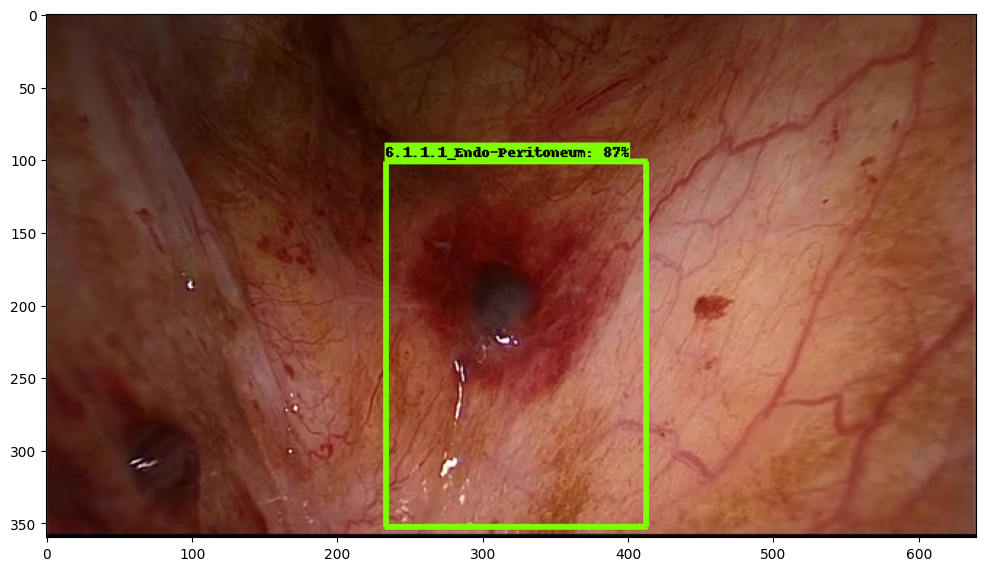

In [18]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('1_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


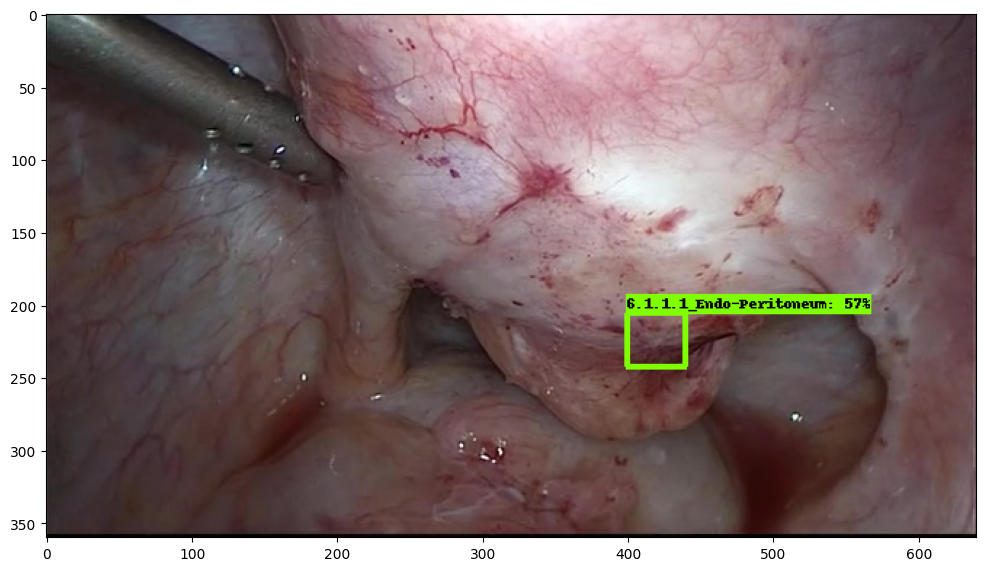

In [19]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('2_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


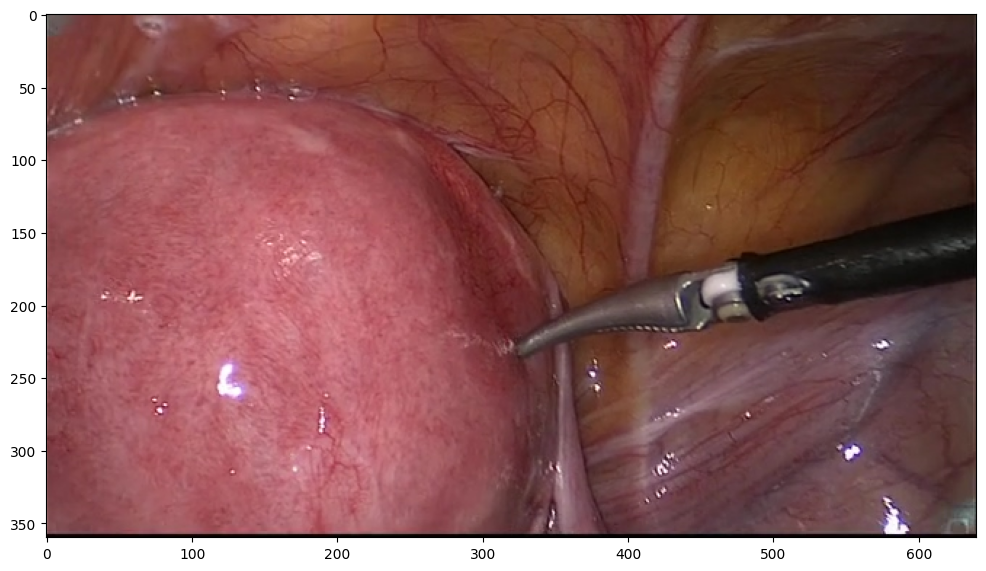

In [20]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('3_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


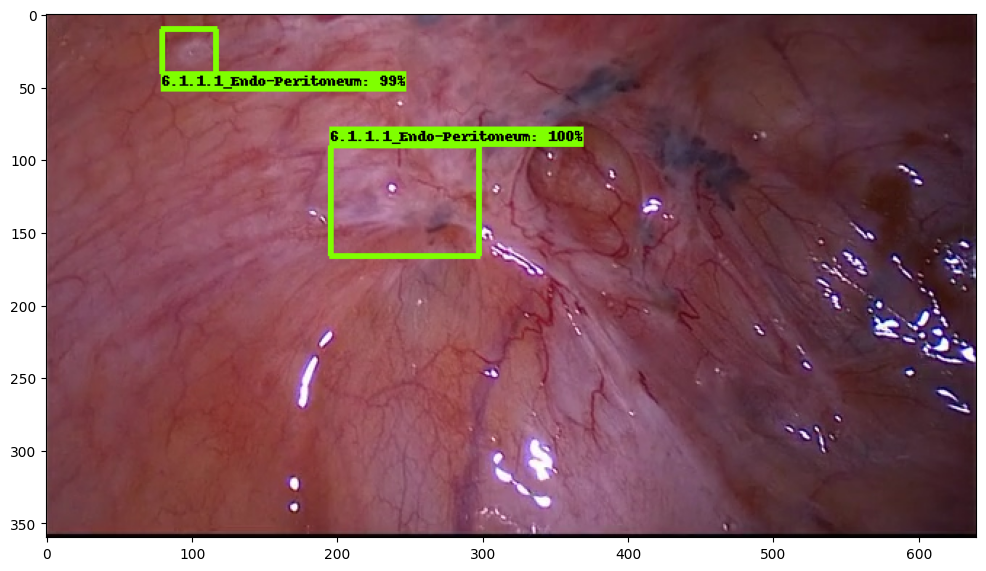

In [21]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('4_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


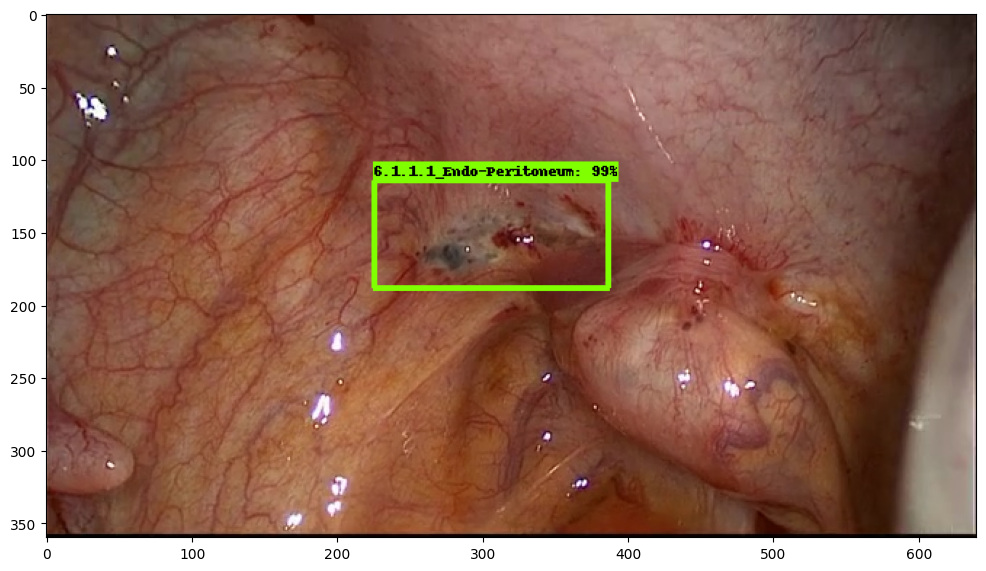

In [22]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('5_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


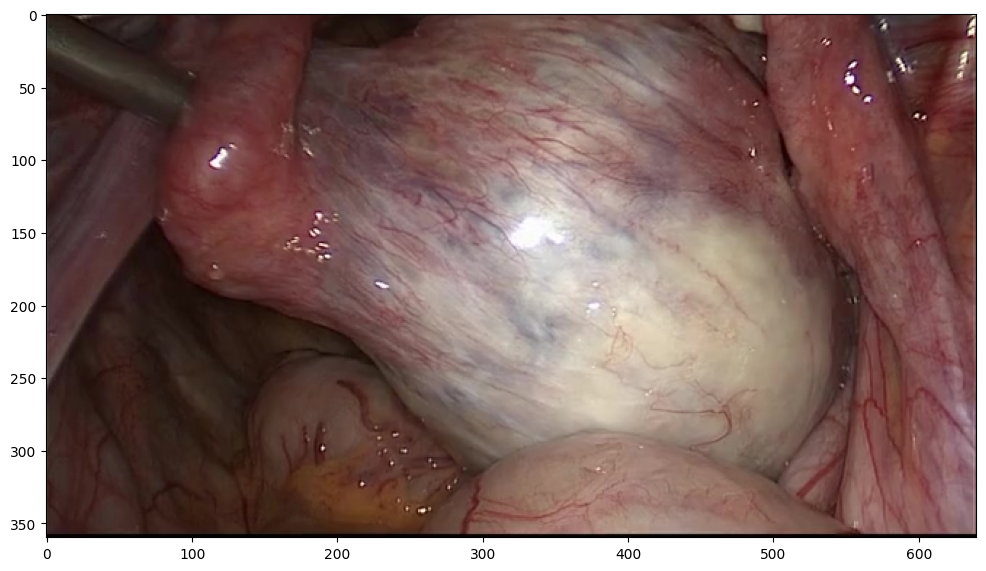

In [23]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('6_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


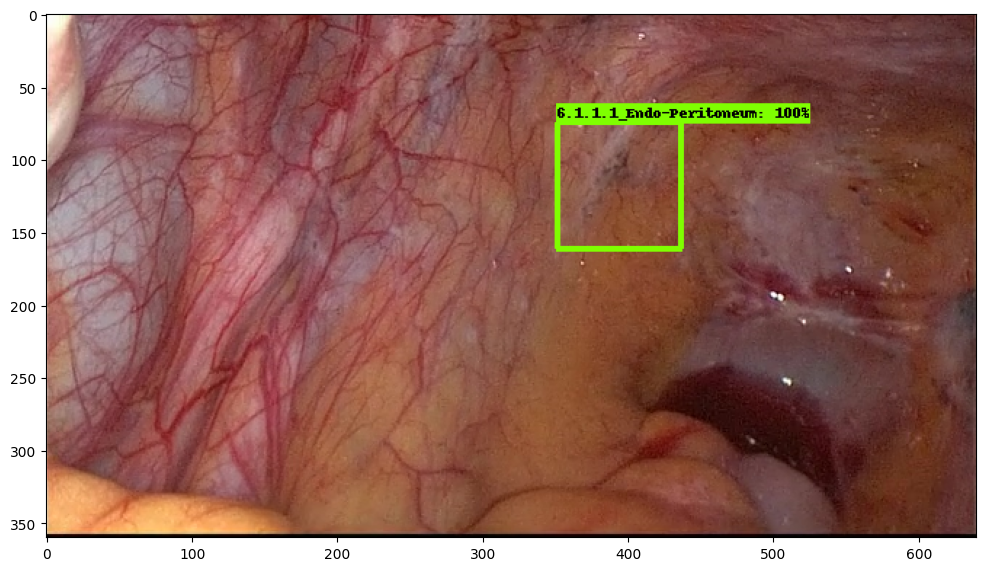

In [25]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('7_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


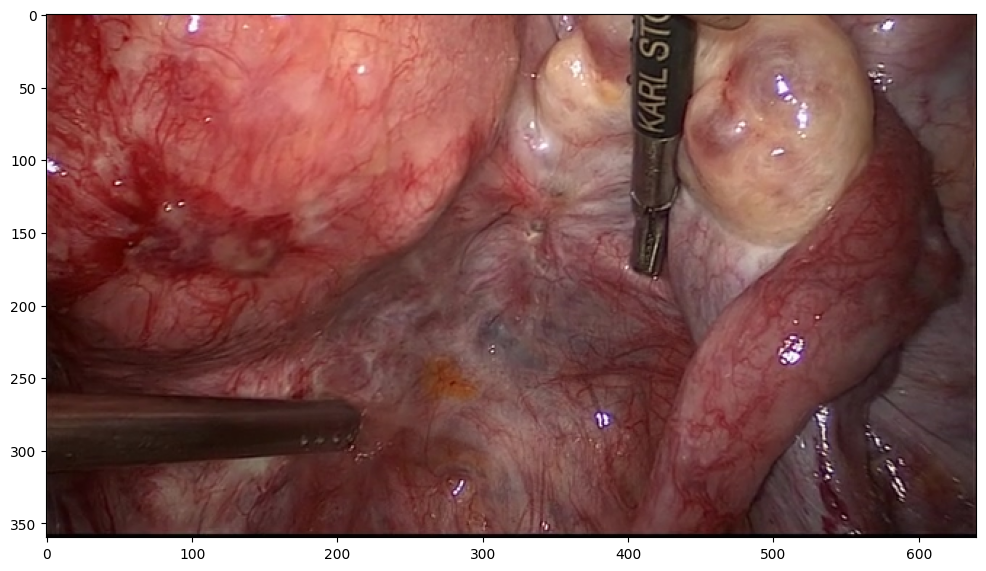

In [26]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('8_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


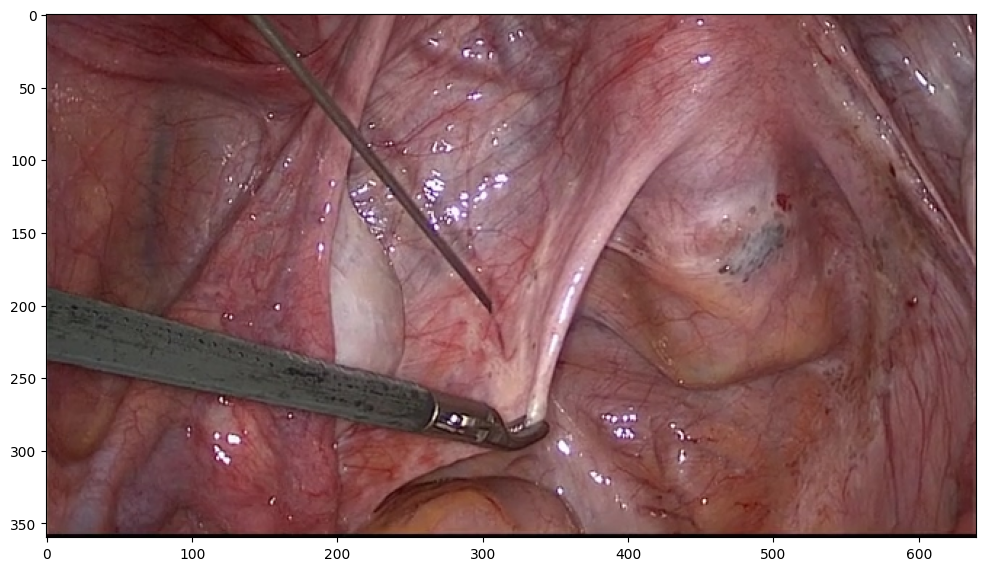

In [27]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('9_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


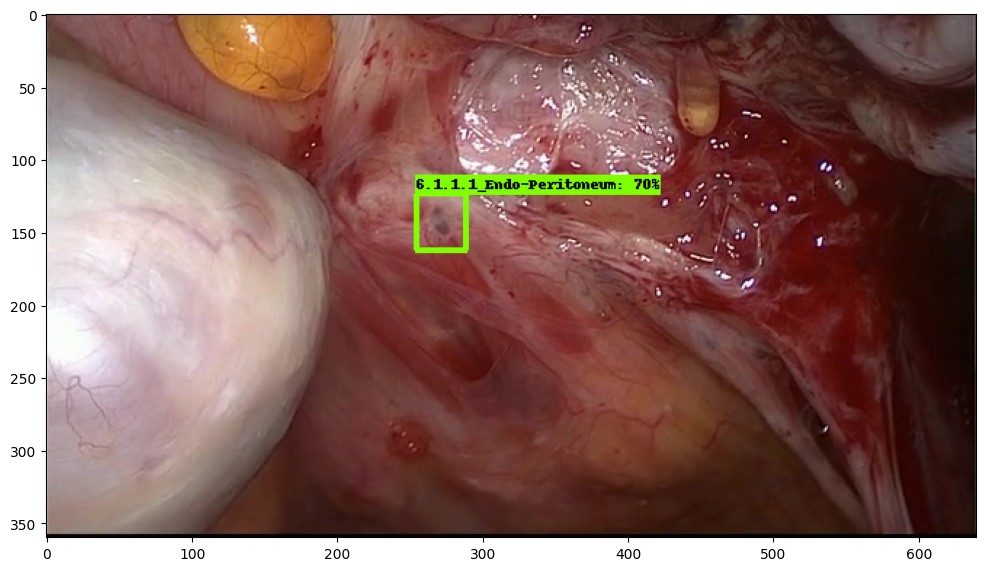

In [28]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('10_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


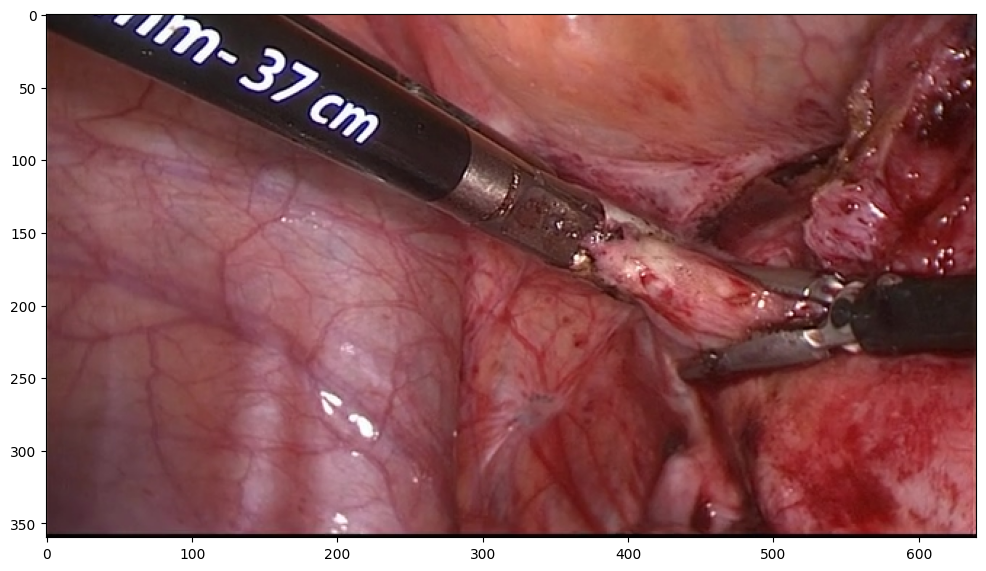

In [29]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('11_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


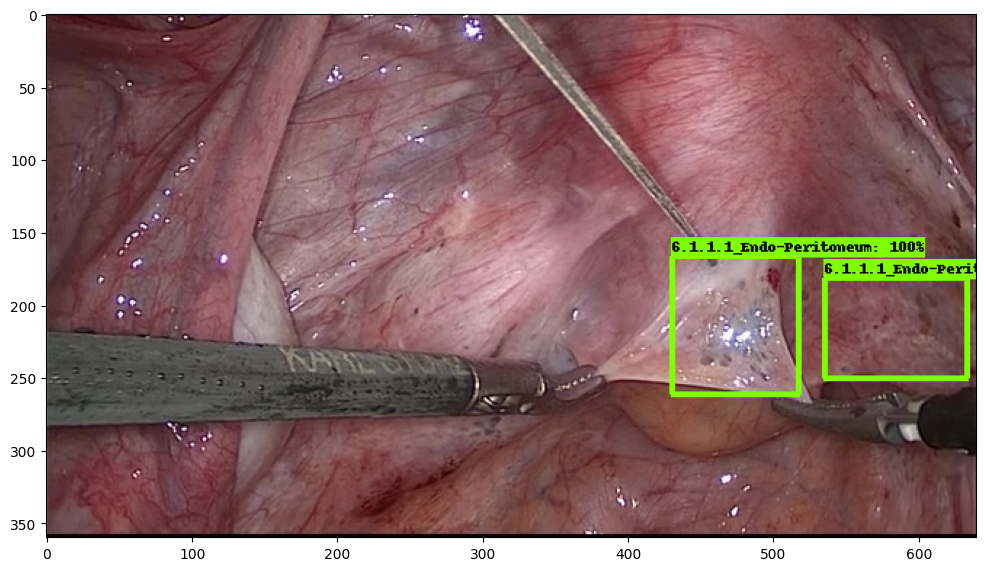

In [30]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('12_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


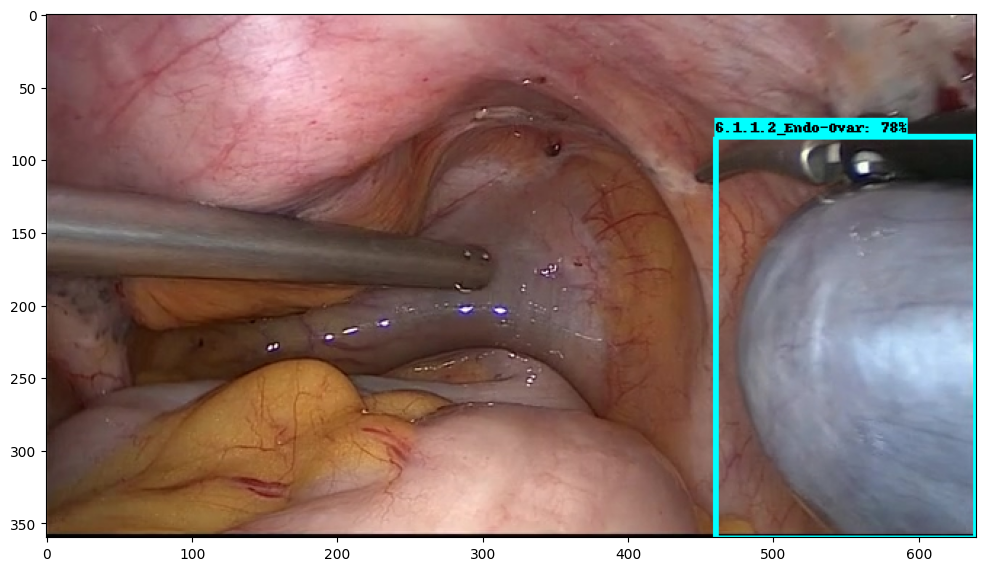

In [31]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('13_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


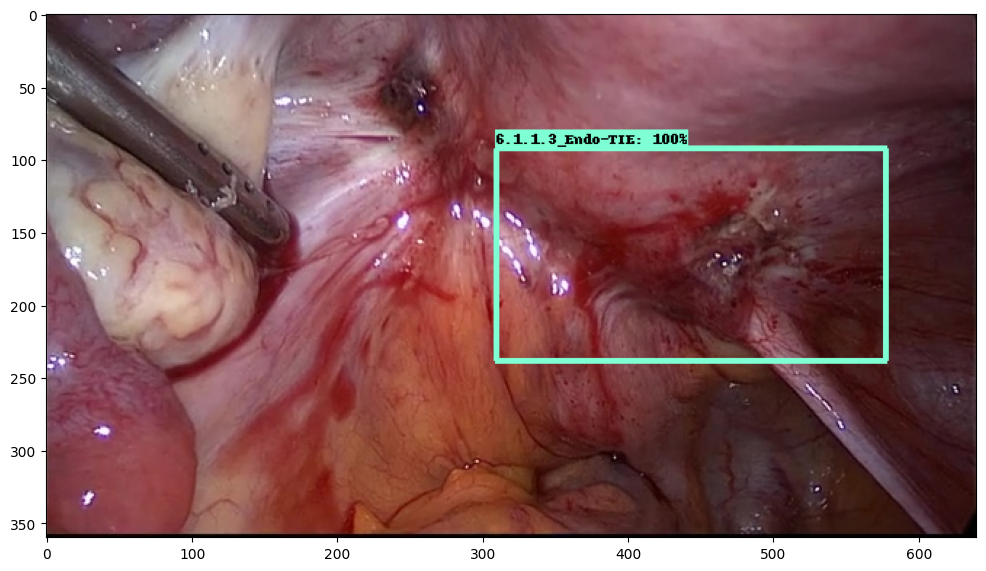

In [36]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('14_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


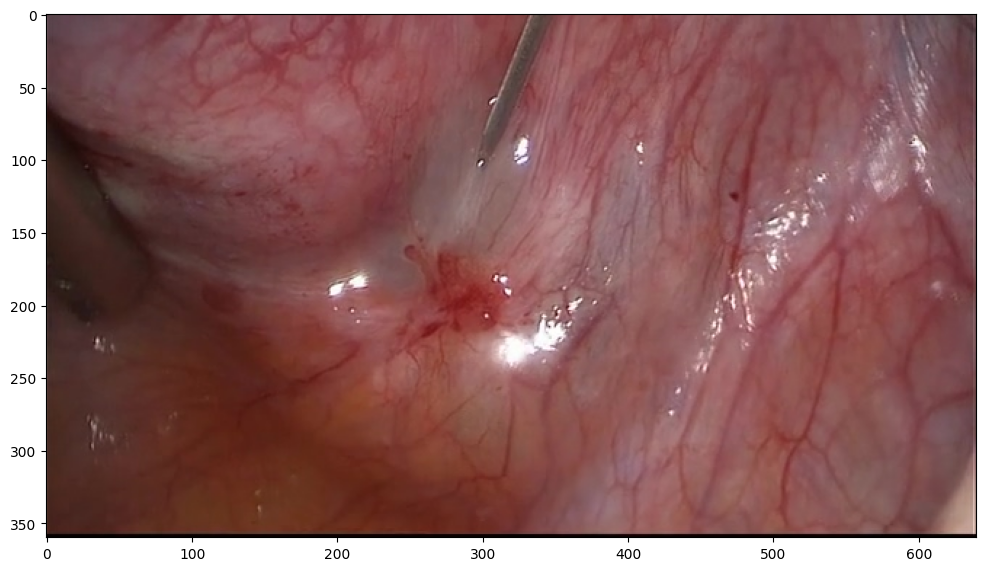

In [35]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('15_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


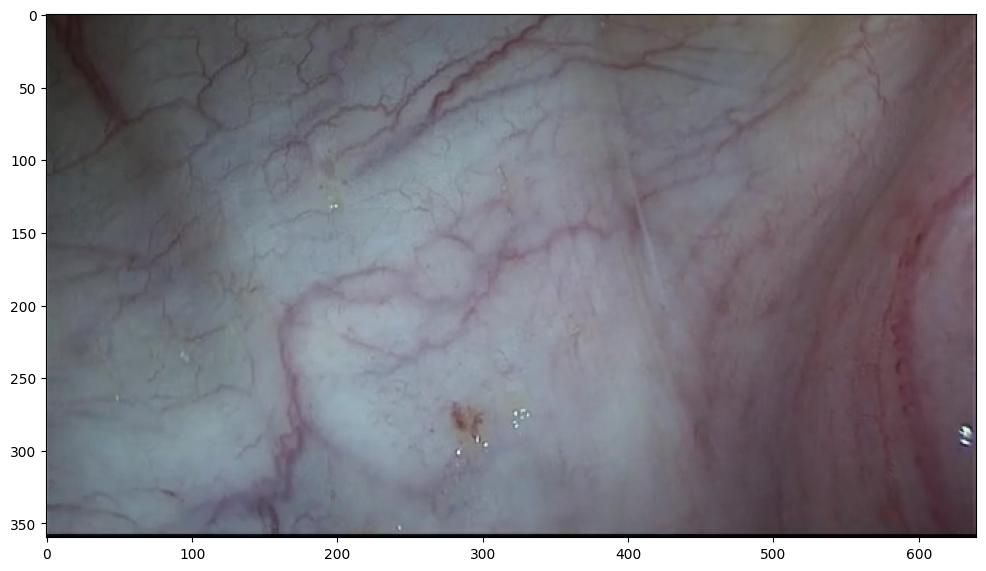

In [38]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('16_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


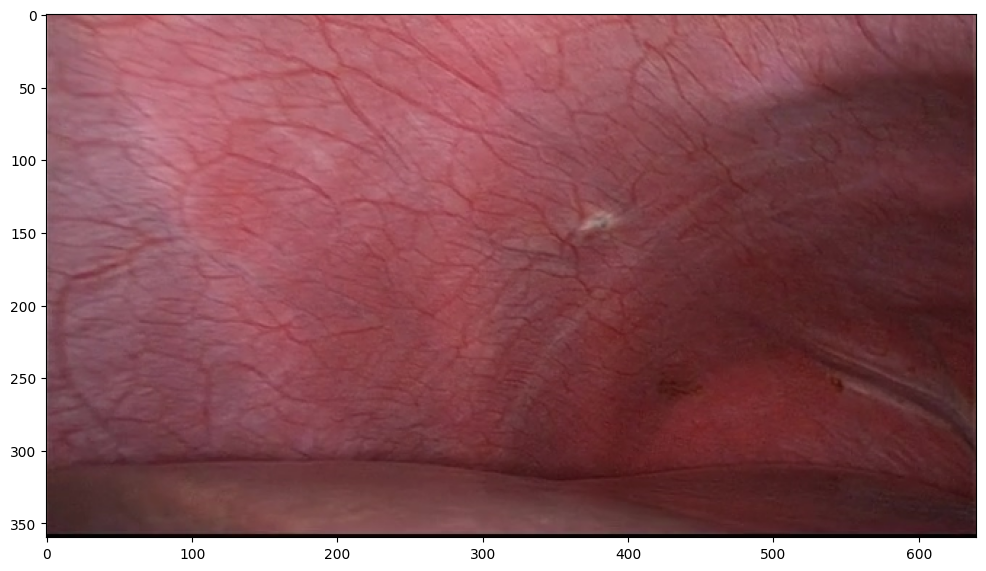

In [39]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('17_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


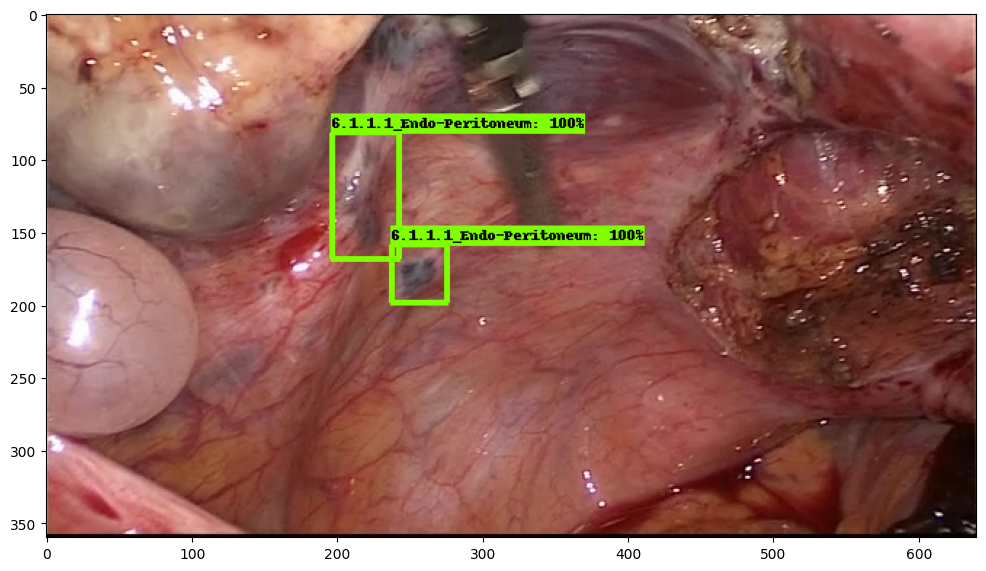

In [40]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('18_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


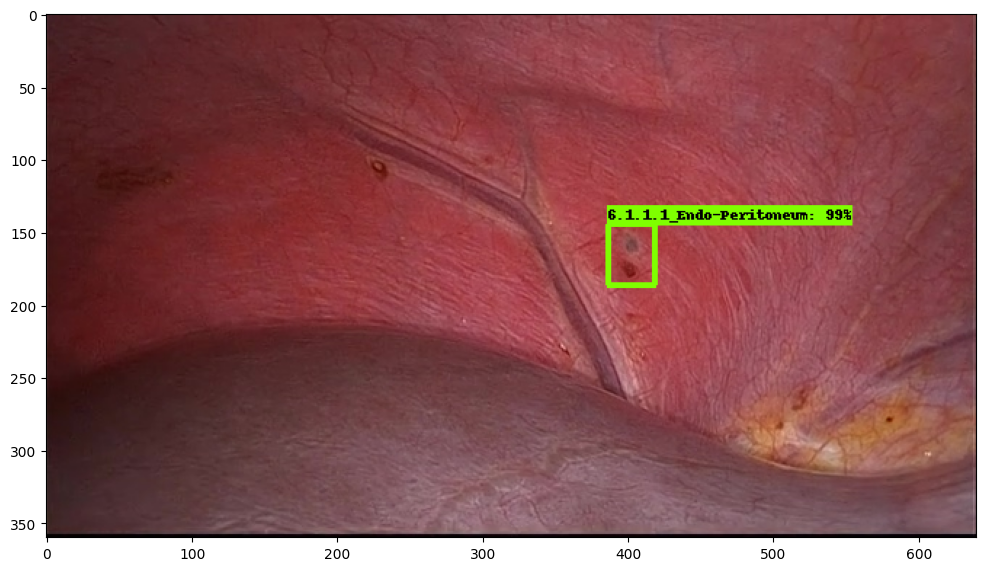

In [41]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('19_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


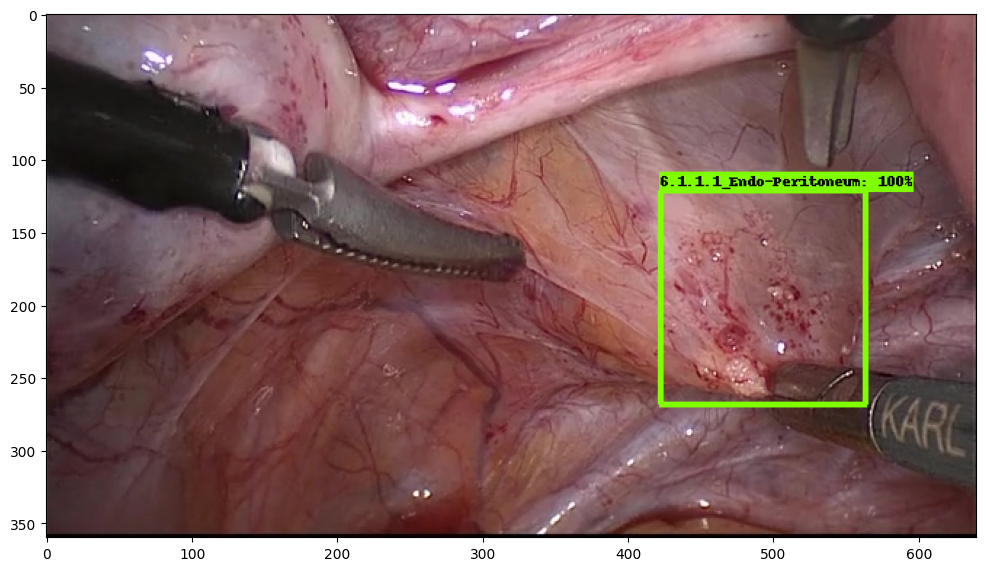

In [44]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('20_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


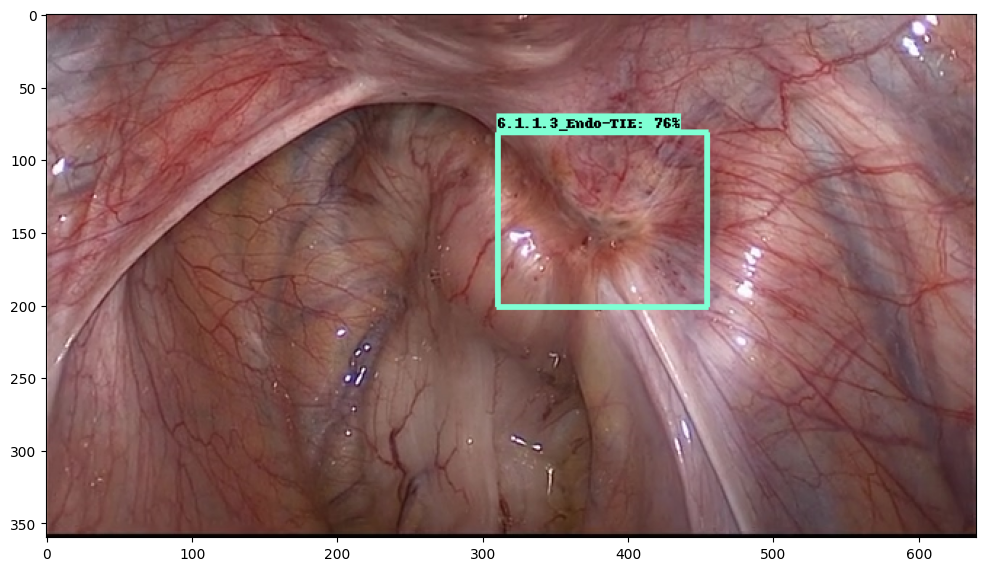

In [45]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('21_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


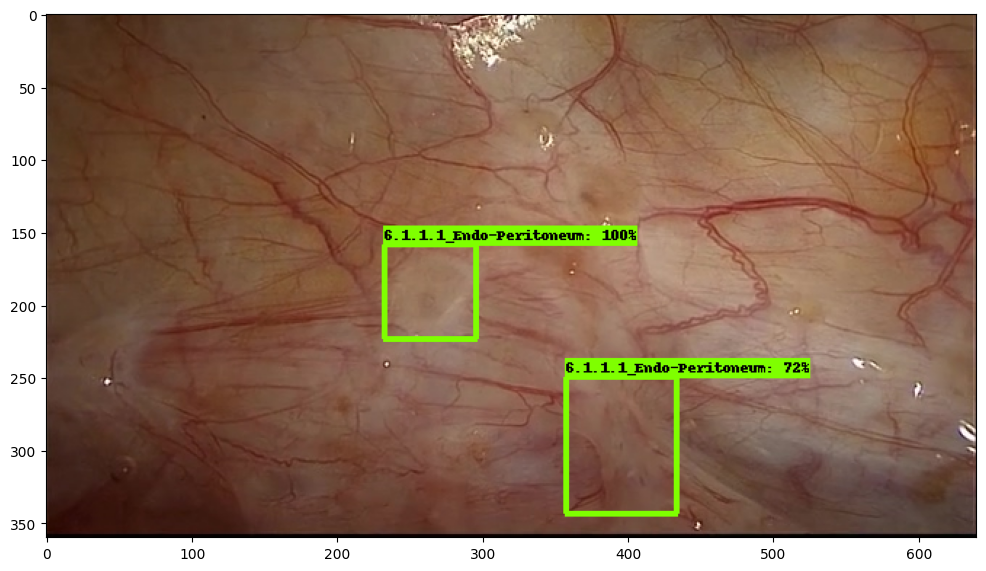

In [51]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('22_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


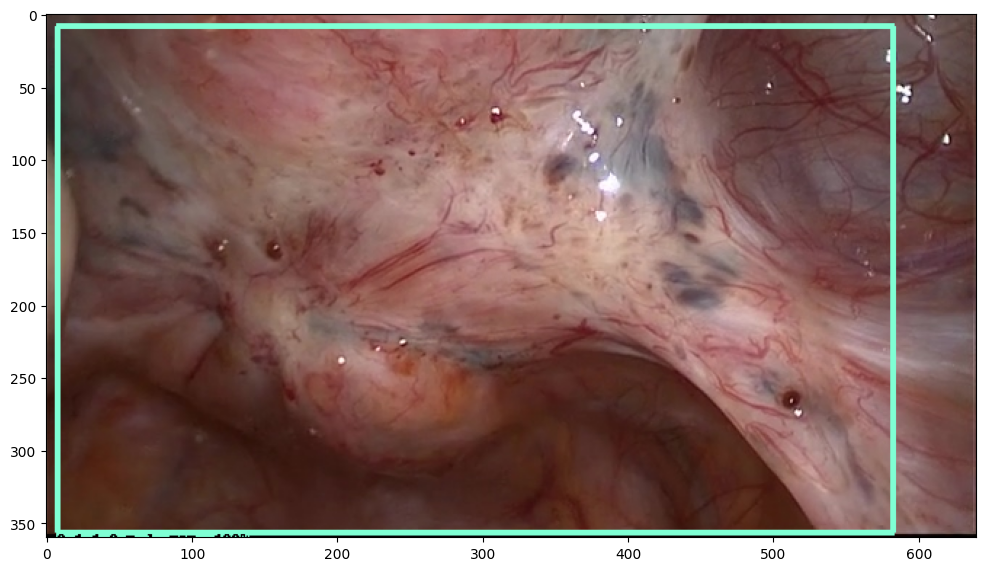

In [55]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('23_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


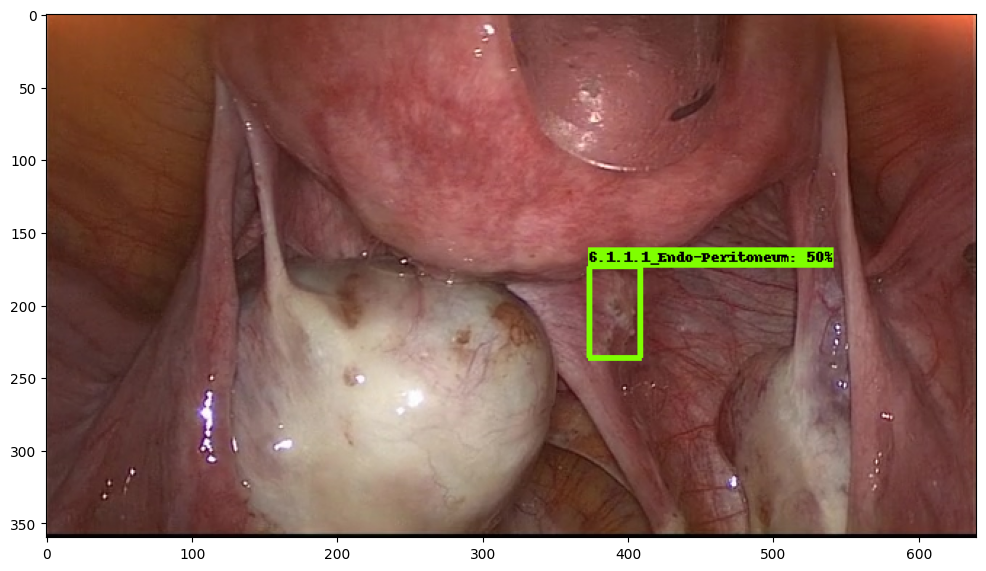

In [56]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('24_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()


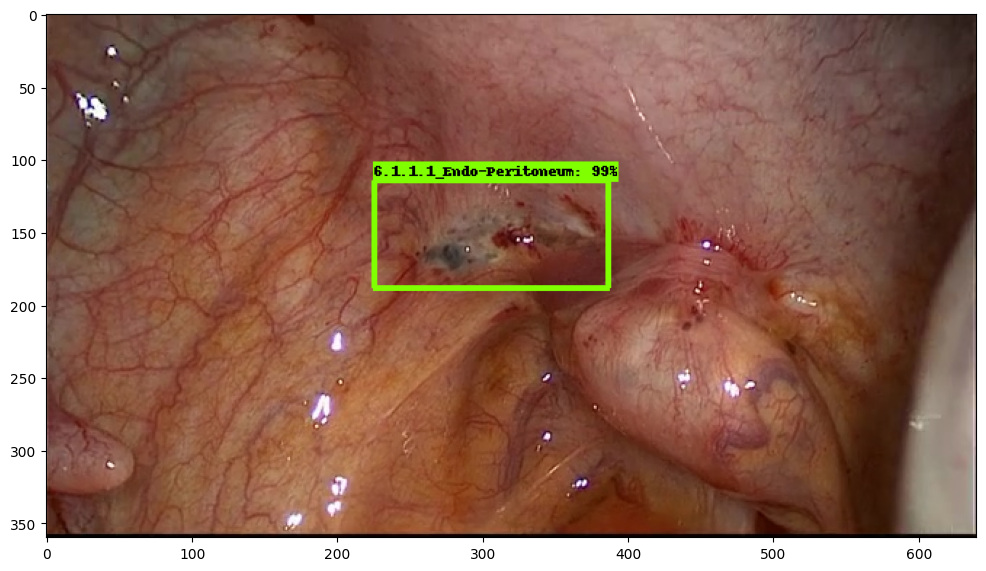

In [64]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('25_efficient_d1.jpg', bbox_inches='tight')

# Show the image
plt.show()
